<a href="https://colab.research.google.com/github/MDC55/Basic-Deep-Learning/blob/main/HF_3nm_1m_1DCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Library for common functions
# Kedar Patki
# %matplotlib qt
# TODO:
#https://www.spectralpython.net/class_func_ref.html
#https://stackoverflow.com/questions/59630622/how-to-enable-zoom-in-out-and-zoom-to-percentage-buttons-in-plots-pane-in-spyder
#-----------------------------------------------------------------------------------------
!pip install spectral


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 20.2 MB/s eta 0:00:00


In [ ]:
from spectral import *
import numpy as np
import spectral.io.envi as envi
import matplotlib.pyplot as plt
# import pdb

In [ ]:
#-----------------------------------------------------------------------------------------
def open_envi_image( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    img = img_envi.load()
    return img

def open_envi_gt_image( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    img = img_envi.load()
    header_file = envi.read_envi_header(hsi_hdr_file)
    print(header_file)
    #print(header_file['bands'])
    return img,header_file



#img2=open_image(hsi_hdr_file).read_band(7)

def wavelength( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    wavelength= img_envi.bands.centers
    bands=img_envi.bands
    return wavelength

def view_hsi_image_color(hsi_img):
    hsi_img_b=hsi_img[:,:,14]
    hsi_img_b_normalized=hsi_img_b/np.max(hsi_img_b)

    hsi_img_g=hsi_img[:,:,30]
    hsi_img_g_normalized=hsi_img_g/np.max(hsi_img_g)

    hsi_img_r=hsi_img[:,:,48]
    hsi_img_r_normalized=hsi_img_r/np.max(hsi_img_r)

    image=np.asarray(255*np.concatenate([hsi_img_b_normalized,
                                         hsi_img_g_normalized,
                                         hsi_img_r_normalized],axis=2),dtype=np.uint8)
    plt.imshow(image)
    plt.show()
    return image


In [ ]:
def get_reflectance_image( input_radiance_img ):
    input_radiance_img=img_rad
    # Get ground-truth reflectance data
    # gt_reflectance_vec_calpanel_80 = 0.80 * np.ones( 224 )
    # gt_reflectance_vec_calpanel_20 = 0.20 * np.ones( 224 )


    # Interpolate and find ground-truth reflectance values at wavelengths of the hsi cube
    # hsi_wavelength_vec = np.array( input_radiance_img.bands.centers )

    # Manually selected cal panel pixels for 2 cal panels at 80% and 20%


    r1_calpanel_80, c1_calpanel_80 = 553,789 #x,y
    r2_calpanel_80, c2_calpanel_80 = 553,790 #x,y

    r1_calpanel_20, c1_calpanel_20 = 20,760  #x,y
    r2_calpanel_20, c2_calpanel_20 = 21,762  #x,y


    # Compute average of the pixels i.e. radiance vectors for each panel
    avg_calpanel_80_radiance_vec = ( input_radiance_img[r1_calpanel_80,c1_calpanel_80,:] +
                                    input_radiance_img[r2_calpanel_80,c2_calpanel_80,:] ) / 2

    avg_calpanel_20_radiance_vec = ( input_radiance_img[r1_calpanel_20,c1_calpanel_20,:] +
                                    input_radiance_img[r2_calpanel_20,c2_calpanel_20,:] ) / 2

    # Compute gain and offset ( a and b ) vectors
    # R=radiance, r=reflectance
    # using R = a*r + b per wavelength, and r = ( R - b ) / a
    # so, a = (R2-R1) / (r2-r1), b = (R1*r2 - R2*r1) / (r2-r1)
    a_vec = ( avg_calpanel_80_radiance_vec - avg_calpanel_20_radiance_vec ) / ( 0.8 - 0.2 )
    b_vec = ( avg_calpanel_20_radiance_vec * 0.8 - avg_calpanel_80_radiance_vec * 0.2 ) / ( 0.8 - 0.2 )

    # Create compensated hsi image i.e. reflectance image
    # reflectance_img_compensated = ( radiance_img - b_vec ) / a_vec
    reflectance_img = ( input_radiance_img - b_vec ) / a_vec

    # save image
    # envi.save_image( '../generated_images/{}_refl.img.hdr'.format( rootname ), reflectance_img )
    return reflectance_img


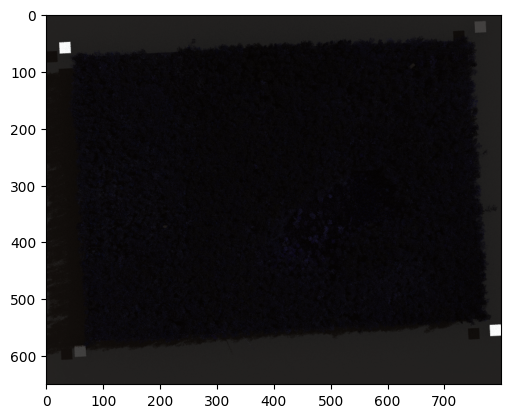

<ipython-input-5-0c4bb76020f9>:37: RuntimeWarning: divide by zero encountered in true_divide
  reflectance_img = ( input_radiance_img - b_vec ) / a_vec
<ipython-input-5-0c4bb76020f9>:37: RuntimeWarning: invalid value encountered in true_divide
  reflectance_img = ( input_radiance_img - b_vec ) / a_vec


In [ ]:

data_dir='/content/drive/MyDrive/My Computer/Drive F/HarvardForestV3/Bandpass/3nm_BP_1m_GSD'
basename='aviris'
img_rad=open_envi_image(data_dir,basename)

view_hsi_image_color(img_rad)

img_ref=get_reflectance_image(img_rad)
wl=wavelength(data_dir,basename)

{'description': "Truth data generated by DIRSIG 2023.23 (65bfd60) 'BasicPlatform' plugin", 'samples': '800', 'lines': '650', 'bands': '9', 'header offset': '0', 'data type': '5', 'interleave': 'BIP', 'byte order': '0', 'band names': ['X Hit Coordinate [m]', 'Y Hit Coordinate [m]', 'Z Hit Coordinate [m]', 'Distance [m]', 'View Angle Cosine []', 'U Texture Coordinate []', 'V Texture Coordinate []', 'Dominant Material Index', 'Dominant Optical Property Index']}


Text(0.5, 1.0, 'Ground Truth')

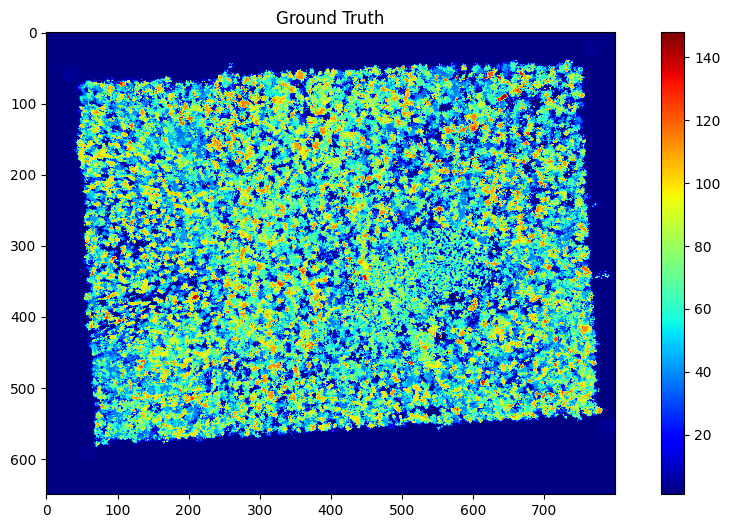

In [ ]:

#%% Ground Truth Labelled Image
#data_dir="F:/HarvardForestV3/2m_GSD"
data_dir='/content/drive/MyDrive/My Computer/Drive F/HarvardForestV3/Bandpass/3nm_BP_1m_GSD'
basename='aviris_truth'
#you can read the header into a Dictionary and then access the bands:
    #https://docs.python.org/3/tutorial/datastructures.html#dictionaries

truth_img,header_file=open_envi_gt_image(data_dir,basename)


from spectral import*
Labelled_data=truth_img.read_bands(7)

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(Labelled_data, cmap='jet')
plt.colorbar()
#plt.axis('off')
plt.title('Ground Truth')

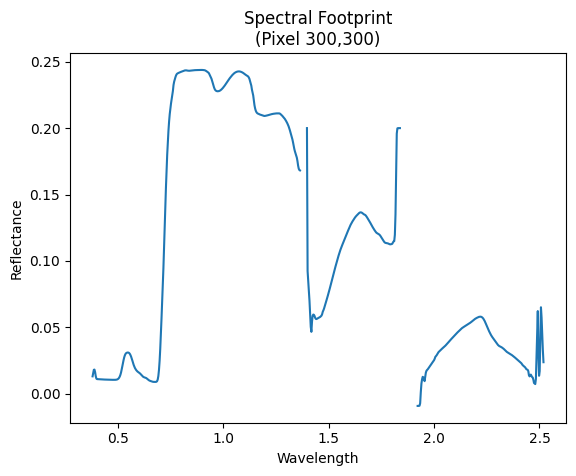

In [ ]:
#%% https://eufat.github.io/2019/02/19/hyperspectral-image-preprocessing-with-python.html

#Using selected pixel by defining its coordinae we can call the pixel vector from above
#corrected hyperspectral tensor. Then we squeeze to acquire un-arrayed elements of vector.
#At last, we could plot its spectral footprint.
leaf_pixel_y = 300
leaf_pixel_x = 300

leaf_pixel = img_ref[
    leaf_pixel_y:leaf_pixel_y+1,
    leaf_pixel_x:leaf_pixel_x+1,
    :]

leaf_pixel_squeezed = np.squeeze(leaf_pixel)

plt.plot(wl, leaf_pixel_squeezed)
plt.title('Spectral Footprint\n(Pixel {},{})'.format(
    leaf_pixel_x, leaf_pixel_y))
plt.xlabel('Wavelength')
plt.ylabel('Reflectance')
plt.show()


Text(0.5, 1.0, 'band - 7')

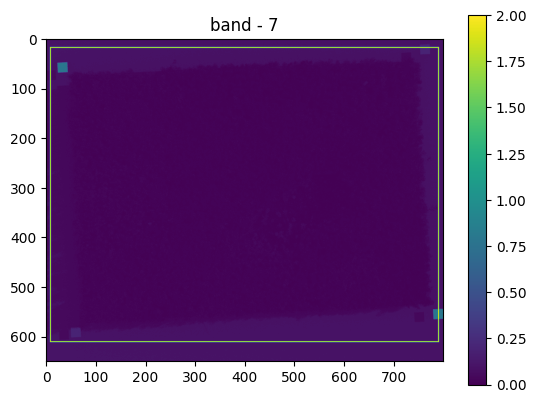

In [ ]:
#%%
def extract_rois(arr, x, y, w, h, intensity, line):
    roi = arr[y:y+h, x:x+w, :]

    bounding_box = arr
    bounding_box[y-line:y, x-line:x+w+line, :] = intensity # top line
    bounding_box[y:y+h, x-line:x, :] = intensity # left line
    bounding_box[y+h:y+h+line, x-line:x+w+line, :] = intensity # bottom line
    bounding_box[y:y+h, x+w:x+w+line, :] = intensity # right line

    return (roi, bounding_box)


coordinates = [
    (10, 20) #(x=horizontal,y=vertical)
]

rois = [] # returned ROIs
width = 780# width and height
height = 590 # width and height
line = 2 # bounding box line width
intensity = 2 # bounding box line intensity
image_bboxed = None


#extract roi for test image
for coordinate in coordinates:
    (x, y) = coordinate
    (roi, image_bboxed) = extract_rois(
        img_ref, x, y, width, height, intensity, line)
    rois.append(roi)


# imshow(image_bboxed, (100, 100, 5))
# imshow(image_bboxed[:, :, 5])


sns.axes_style('whitegrid')
#fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(image_bboxed[:, :, q])
plt.colorbar()
#plt.axis('off')
plt.title(f'band - {q}')

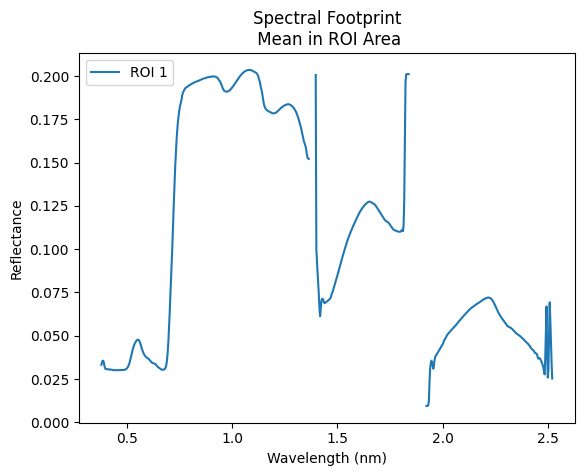

In [ ]:
#%%
for i in range(len(rois)):
    roi = rois[i]
    intensity = []
    for b in range(roi.shape[2]):
        intensity.append(np.mean(roi[:, :, b]))
    plt.plot(wl, intensity, label='ROI {}'.format(i+1))

plt.legend(loc='upper left')
plt.title('Spectral Footprint\n Mean in ROI Area')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.show()


Text(0.5, 1.0, 'band - 7')

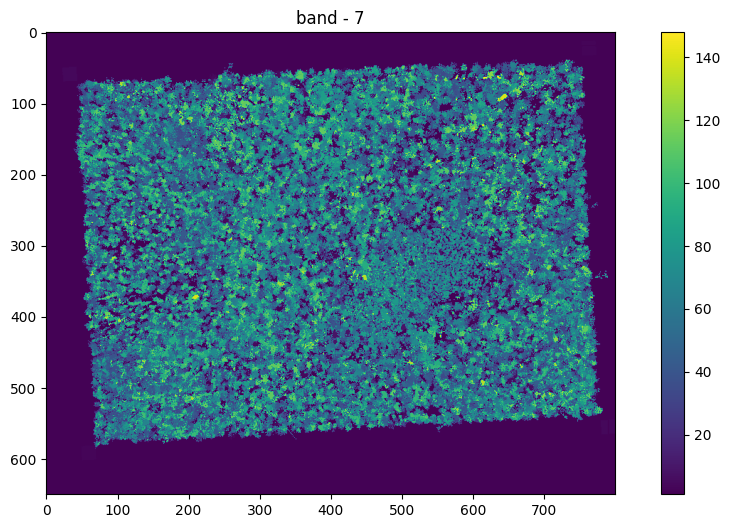

In [ ]:
#%%
#extract same roi for ground truth image
rois_gt = [] # returned ROIs
width = 780# width and height
height = 590 # width and height
line = 2 # bounding box line width
intensity = 2 # bounding box line intensity
image_bboxed = None


for coordinate in coordinates:
    (x, y) = coordinate
    (roi_gt, image_bboxed) = extract_rois(
        truth_img, x, y, width, height, intensity, line)
    rois_gt.append(roi_gt)

from spectral import*
Labelled_data_roi=roi_gt.read_bands(7)

# imshow(image_bboxed, (100, 100, 5))
# imshow(image_bboxed[:, :, 5])

sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(image_bboxed[:, :, q])
plt.colorbar()
#plt.axis('off')
plt.title(f'band - {q}')

In [ ]:
#%% combining 'acerpe':[82,9,81,63,53],'acerru':[34,40,71,45,39,70] into acer
#    'betual':[133,77,64,88,22],'betule':[113,93,68,27,42],'betupa':[89],'betupo':[47,121,119,78] into betu
#    'pinure':[37,104,110,15],'pinust':[131,102,28,76,46,33], into pinu
#    'queral':[69,36,120,16,49,25],'querru':[67,112,92,61,5,83,26,80,66,8,79,7], into quer

speciesToID = {
    'acer':[82,9,81,63,53,34,40,71,45,39,70],
    'aronme':[54,98,132,108],
    'bark':[65,62,117,135],
    'betu':[133,77,64,88,22,113,93,68,27,42,89,47,121,119,78],
    'castde':[116,14,115,51,50],
    'dead':[17,59,38,60,35,130],
    'fagugr':[123,72,57,96,18],
    'fraxni':[122],
    'hamavi':[74,12,85,55,75],
    'ilexve':[32,73,95,107,56],
    'kalmla':[20],
    'larila':[84],
    'lyonli':[127,124,105,129,126],
    'nemomu':[21,13,86,29,118],
    'nysssy':[6],
    'ostrvi':[94],
    'piceab':[114],
    'pinu':[37,104,110,15,131,102,28,76,46,33],
    'quer':[69,36,120,16,49,25,67,112,92,61,5,83,26,80,66,8,79,7],
    'rhodpr':[11,99,109],
    'soil':[19,128,23,31],
    'tsugca':[52,43,30,103,97,100],
    'ulmuam':[134],
    'vaccco':[44,91,125,48,90,10,41,111],
    'vibual':[58,106,101,24,87]
}

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
{1: ['acer'], 2: ['aronme'], 3: ['bark'], 4: ['betu'], 5: ['castde'], 6: ['fagugr'], 7: ['fraxni'], 8: ['hamavi'], 9: ['ilexve'], 10: ['kalmla'], 11: ['larila'], 12: ['nemomu'], 13: ['nysssy'], 14: ['ostrvi'], 15: ['piceab'], 16: ['pinu'], 17: ['quer'], 18: ['rhodpr'], 19: ['soil'], 20: ['ulmuam'], 21: ['vibual']}


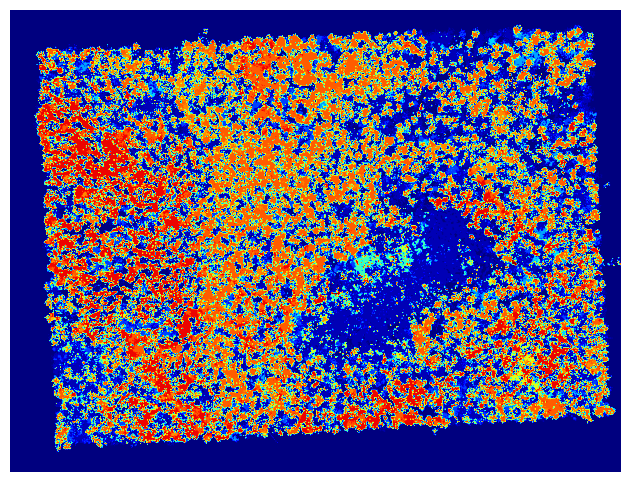

In [ ]:
#%%https://stackoverflow.com/questions/67761919/how-to-apply-a-lookup-to-a-label-image-with-more-than-256-labels
#https://realpython.com/iterate-through-dictionary-python/
# Create empty label array
labelArray = np.zeros_like(Labelled_data_roi)
labelsToSpecies = {}
# Create labels
# label = 1
# for species in speciesToID:
#     for value in speciesToID[species]:
#         indices = np.where(Labelled_data_roi == value)
#         labelArray[indices] = label
#         if label not in labelsToSpecies:
#             labelsToSpecies[label] = [species]
#     label += 1

label = 1
for species in speciesToID:
    for value in speciesToID[species]:
        # Find all locations where the value exists in the imgArray
        indices = np.where(Labelled_data_roi == value)
        labelArray[indices] = label
        if label not in labelsToSpecies:
            labelsToSpecies[label] = [species]
    label += 1  if len(indices[0]) > 0 and all(Labelled_data_roi[indices] == value) else 0

print(labelArray)

sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(labelArray, cmap='jet')
#plt.colorbar()
plt.axis('off')
#plt.title('Ground Truth')

#print(labelsToSpecies)
labelsToSpecies_original=labelsToSpecies

# Convert labelArray elements to integers
labelArray = labelArray.astype(int)

# Count the number of samples for each class
class_counts = np.bincount(labelArray.flatten())

# Find the classes with less than two samples
classes_to_replace = np.where(class_counts < 2)[0]

# Replace the class labels with zero
for cls in classes_to_replace:
    labelArray[labelArray == cls] = 0

for key in classes_to_replace:
    labelsToSpecies.pop(key, None)

print(labelsToSpecies)



In [ ]:
#%% Extracting pixels using ROI of the HSI
#from untitled0-copy.py... F:\Codes from Other Projects\HSI Image classification Code Practice
X=roi
#y=Labelled_data_roi #ROI of the ground truth image
y=labelArray #modified labelled ground truth data
import pandas as pd
def extract_pixels(X, y,save_name):
  q = X.reshape(-1, X.shape[2])
  image_nan_removed=np.where(np.isnan(q), 0, q)
  image_nan_removed=np.where(np.isinf(image_nan_removed), 0, image_nan_removed)
  image_nan_removed = image_nan_removed.astype(np.float32)
  df = pd.DataFrame(data = image_nan_removed)
  df = pd.concat([df, pd.DataFrame(data = y.ravel())], axis=1) #axis 1=column
  df.columns= [f'band{i}' for i in range(1, 1+X.shape[2])]+['class']
  #df.to_csv(f'{save_name}.csv', index=False)
  return df

#I have 341504 rows and 224 column in the df
df = extract_pixels(X, y,save_name='hvd1')
df.head()
#[:, :] literally means [all rows, all columns]
#Indexing in python starts from 0 when you go from the first element to the last, but it starts from -1 when you start from the last element.
#So, when you do [:, -1] it means you are taking all the rows and only the last column. -1 represents the last column
#When you do [:, :-1], it means you are taking all the rows and all the columns except the last column.
df.iloc[:, :-1].describe()
null_sum=df.isnull().sum()


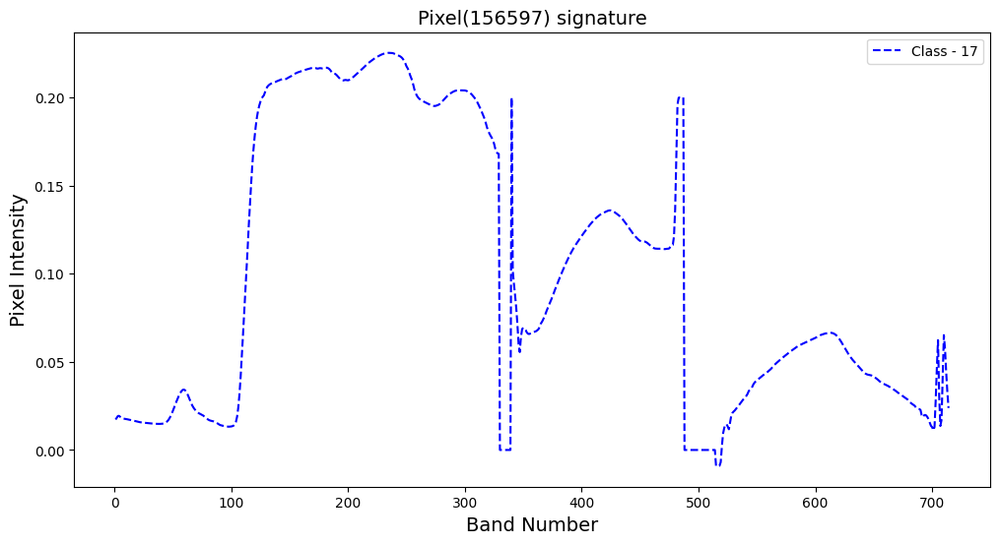

In [ ]:
#%% Visualizing spectral signature
def plot_signature(df):
    plt.figure(figsize=(12, 6))
    pixel_no = np.random.randint(df.shape[0])
    plt.plot(range(1, len(wl)+1), df.iloc[pixel_no, :-1].values.tolist(), 'b--', label= f'Class - {df.iloc[pixel_no, -1]}')
    plt.legend()
    plt.title(f'Pixel({pixel_no}) signature', fontsize=14)
    plt.xlabel('Band Number', fontsize=14)
    plt.ylabel('Pixel Intensity', fontsize=14)
    plt.show()

plot_signature(df)



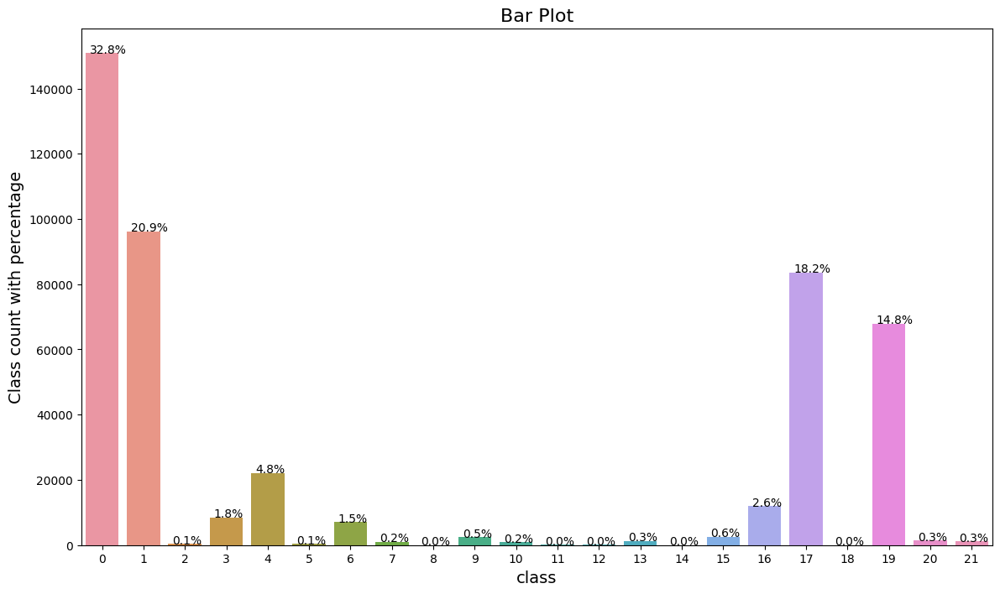

In [ ]:
#%%
#https://www.geeksforgeeks.org/how-to-annotate-bars-in-barplot-with-matplotlib-in-python/
plt.figure(figsize=(14, 8))
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picke
ax = sns.countplot(x='class', data=df[['class']])

  # Iterating over the bars one-by-one
  # passing the coordinates where the annotation shall be done
  # x-coordinate: p.get_x() + p.get_width() / 2
  # y-coordinate: p.get_height()
for p in ax.patches:
        ax.annotate('{:.1f}%'.format(100*p.get_height()/df.shape[0]), (p.get_x()+0.1, p.get_height()+5))

plt.ylabel('Class count with percentage', fontsize=14)
plt.xlabel('class', fontsize=14)
plt.title('Bar Plot', fontsize=16)
plt.show()


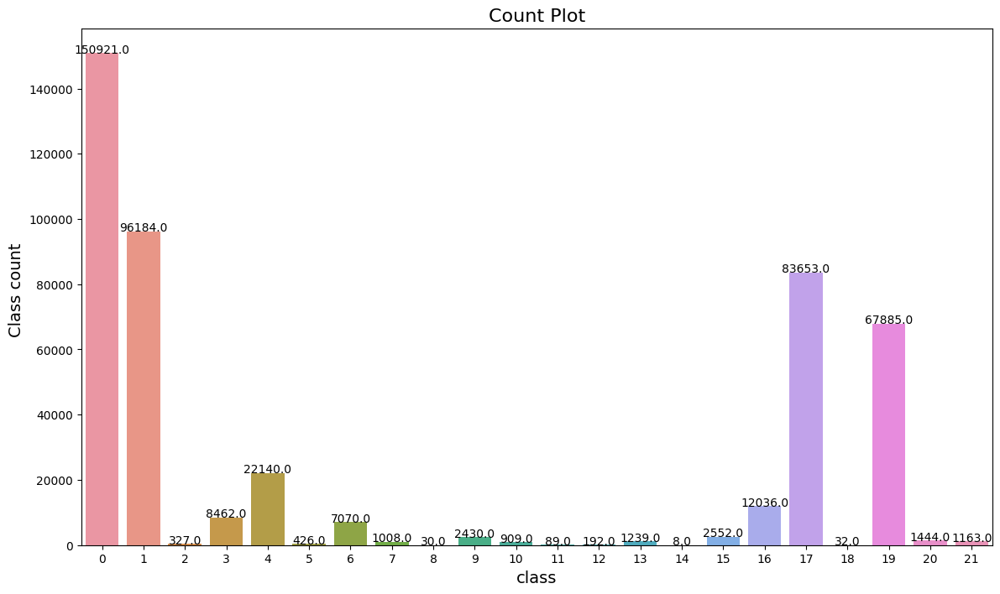

In [ ]:
#https://stackoverflow.com/questions/55104819/display-count-on-top-of-seaborn-barplot
plt.figure(figsize=(14, 8))
ax = sns.countplot(x='class', data=df[['class']])
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picke
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")
plt.ylabel('Class count ', fontsize=14)
plt.xlabel('class', fontsize=14)
plt.title('Count Plot', fontsize=16)
plt.show()


In [ ]:
# group by the class column and count the number of samples in each group
group_counts = df.groupby('class').size()

# filter the groups that have a count of 2
two_sample_classes = group_counts[group_counts <= 2]

# print the result
print(two_sample_classes.index.tolist())

[]


Enter the band Number(1-224) :8


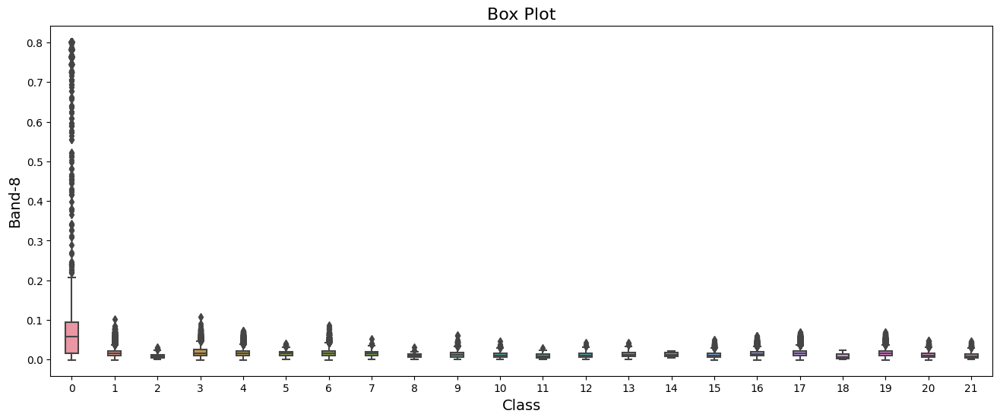

In [ ]:
#%% Box plot w.r.t bands of the HSI


plt.figure(figsize=(16, 6))
n = int(input('Enter the band Number(1-224) :'))
sns.boxplot( x=df["class"], y=df[f"band{n}"], width=0.3);
plt.title('Box Plot', fontsize= 16)
plt.xlabel('Class', fontsize= 14)
plt.ylabel(f'Band-{n}', fontsize= 14)
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Conv1D, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

Scaling Data

In [ ]:
# from sklearn.preprocessing import minmax_scale
# X = df.iloc[:, :-1].values
# y = df.iloc[:, -1].values
# X.shape, y.shape
# X_scaled = minmax_scale(X, axis = 0);
# y = to_categorical(df.loc[:, 'class'])
# X_scaled.shape, y.shape

In [ ]:
df1 = df[df['class']!=0] # taking non zero group
df1 = df1.groupby('class').filter(lambda x: len(x) >= 2) #to drop the rows that have only two samples
ind = ['band'+str(i) for i in range(1, df1.shape[-1])]

X = df1.loc[:, ind]
y = to_categorical(df1.loc[:, 'class']) ##one-hot encode target column
X.shape, y.shape


((309279, 714), (309279, 22))

In [ ]:
#%%

from sklearn.model_selection import train_test_split

#Dividing the reduced data into train and test
X_train, X_test, y_train, y_test, indices_train, indices_test  = train_test_split(X, y, range(X.shape[0]),  stratify=y,
                                                                                  test_size = 0.30, random_state = 11)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}")


X_train: (216495, 714)
y_train: (216495, 22)
X_test: (92784, 714)
y_test: (92784, 22)


In [ ]:
#%%

#https://stackoverflow.com/questions/63037248/is-it-correct-to-use-a-single-standardscaler-before-splitting-data
#https://www.kaggle.com/code/lilyelizabethjohn/standardization-using-standardscaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train,)

X_test = scaler.transform(X_test)

X_train.shape, X_test.shape


((216495, 714), (92784, 714))

In [ ]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape
X_train[1].shape

(714,)

In [ ]:
len(ind)

714

In [ ]:
X_train = X_train.reshape(-1, len(ind), 1)
X_test = X_test.reshape(-1, len(ind), 1)

In [ ]:

model = Sequential(name = 'Salinas_CNN')

model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer1'))
model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu' , name = 'Layer2'))
model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu' , name = 'Layer3'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer1'))
model.add(Dropout(0.4, name = 'Dropout1'))

model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer4'))
model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer5'))
model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer6'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer2'))
model.add(Dropout(0.4, name = 'Dropout2'))

model.add(Flatten(name = 'Flatten'))

model.add(Dense(25, activation='relu', name = 'DenseLayer'))

model.add(Dense(n_outputs, activation='softmax', name = 'OutputLayer'))


model.summary()

Model: "Salinas_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 714, 64)           256       
                                                                 
 Layer2 (Conv1D)             (None, 714, 64)           12352     
                                                                 
 Layer3 (Conv1D)             (None, 714, 64)           12352     
                                                                 
 MaxPooling_Layer1 (MaxPooli  (None, 357, 64)          0         
 ng1D)                                                           
                                                                 
 Dropout1 (Dropout)          (None, 357, 64)           0         
                                                                 
 Layer4 (Conv1D)             (None, 357, 32)           6176      
                                                       

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Salinas_Model.h5',
                             monitor = 'val_loss',
                             mode ='min',
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [ ]:
hist = model.fit(X_train,
                       y_train,
                       epochs = 100,
                       batch_size = 256 ,
                       validation_data = (X_test, y_test),
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])

Epoch 1/100
846/846 [==============================] - 46s 40ms/step - loss: 1.0033 - accuracy: 0.6892 - val_loss: 0.7560 - val_accuracy: 0.7675
Epoch 2/100
846/846 [==============================] - 32s 38ms/step - loss: 0.7271 - accuracy: 0.7734 - val_loss: 0.6405 - val_accuracy: 0.8016
Epoch 3/100
846/846 [==============================] - 33s 40ms/step - loss: 0.6650 - accuracy: 0.7910 - val_loss: 0.6177 - val_accuracy: 0.8029
Epoch 4/100
846/846 [==============================] - 33s 39ms/step - loss: 0.6350 - accuracy: 0.7998 - val_loss: 0.5802 - val_accuracy: 0.8142
Epoch 5/100
846/846 [==============================] - 33s 39ms/step - loss: 0.6146 - accuracy: 0.8049 - val_loss: 0.5558 - val_accuracy: 0.8205
Epoch 6/100
846/846 [==============================] - 33s 39ms/step - loss: 0.6043 - accuracy: 0.8071 - val_loss: 0.5552 - val_accuracy: 0.8193
Epoch 7/100
846/846 [==============================] - 33s 39ms/step - loss: 0.5927 - accuracy: 0.8092 - val_loss: 0.5468 - val_ac

In [ ]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

<IPython.core.display.Javascript object>

In [ ]:
#https://www.codespeedy.com/how-to-change-figure-size-in-plotly-in-python/
import plotly.graph_objects as go
import plotly.express as px

hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))
fig.update_traces(line=dict( width=4))
fig.update_layout( title=" ", font=dict(size=20),
                  xaxis_title="Number of Epochs",
                  yaxis_title="Loss and Accuracy",
                  autosize=False,
                  width=800,
                  height=400,
                  margin=dict( l=50,
                              r=50,
                              b=50,
                              t=50,
                              pad=4
                              ),
                  #paper_bgcolor="LightSteelBlue",
                  legend=dict(orientation="h",entrywidth=110,yanchor="bottom", y=1.0,xanchor="right",x=1,font=dict(size=15))
)
config = {
  'toImageButtonOptions': {
    'format': 'png', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 500,
    'width': 700,
    'scale':6 # Multiply title/legend/axis/canvas sizes by this factor
  }
}


fig.show(config=config)
#fig.show()


In [ ]:
loss, acc = model.evaluate(X_test, y_test)

2900/2900 [==============================] - 13s 4ms/step - loss: 0.4602 - accuracy: 0.8409


In [ ]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 84.08992886543274
Loss: 0.4602047801017761


In [ ]:
from tensorflow.keras.models import load_model

model = load_model("Salinas_Model.h5")

In [ ]:
from sklearn.metrics import classification_report
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1)))

2900/2900 [==============================] - 9s 3ms/step
              precision    recall  f1-score   support

           1       0.89      0.84      0.87     30377
           2       0.35      0.68      0.46        50
           3       0.37      0.65      0.47      1464
           4       0.79      0.81      0.80      6469
           5       0.23      0.52      0.32        56
           6       0.69      0.80      0.74      1837
           7       0.80      0.84      0.82       288
           8       0.00      0.00      0.00         0
           9       0.73      0.77      0.75       689
          10       0.35      0.72      0.47       132
          11       0.00      0.00      0.00         0
          12       0.03      1.00      0.07         2
          13       0.71      0.86      0.78       307
          14       0.00      0.00      0.00         0
          15       0.71      0.77      0.74       702
          16       0.78      0.77      0.77      3670
          17       0.89 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [ ]:
from sklearn.metrics import  f1_score
#print("f1_score:",(f1_score(y_test, y_pred, average='micro')))

# f1_score(y_test, pred, average='micro')

from sklearn.metrics import cohen_kappa_score

print("Cohen Kappa Score :",cohen_kappa_score(pred, np.argmax(y_test, 1))*100)

Cohen Kappa Score : 79.46976853892605


In [ ]:
print(labelsToSpecies)

{1: ['acer'], 2: ['aronme'], 3: ['bark'], 4: ['betu'], 5: ['castde'], 6: ['fagugr'], 7: ['fraxni'], 8: ['hamavi'], 9: ['ilexve'], 10: ['kalmla'], 11: ['larila'], 12: ['nemomu'], 13: ['nysssy'], 14: ['ostrvi'], 15: ['piceab'], 16: ['pinu'], 17: ['quer'], 18: ['rhodpr'], 19: ['soil'], 20: ['ulmuam'], 21: ['vibual']}


In [ ]:
# Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
                            target_names = ['1: acer', '2: aronme','3: bark', '4: betu', '5: castde', '6: fagugr',
                                            '7: fraxni','8: hamavi','9: ilexve',
                                            '10: kalmla', '11: larlia', '12: nemomu','13: nysssy',
                                            '14: ostrvi', '15: piceab','16: pinu',
                                            '17: quer', '18: rhodpr',  '19: soil','20: ulmuam','21: vibual'
                                            ]))

              precision    recall  f1-score   support

     1: acer       0.89      0.84      0.87     30377
   2: aronme       0.35      0.68      0.46        50
     3: bark       0.37      0.65      0.47      1464
     4: betu       0.79      0.81      0.80      6469
   5: castde       0.23      0.52      0.32        56
   6: fagugr       0.69      0.80      0.74      1837
   7: fraxni       0.80      0.84      0.82       288
   8: hamavi       0.00      0.00      0.00         0
   9: ilexve       0.73      0.77      0.75       689
  10: kalmla       0.35      0.72      0.47       132
  11: larlia       0.00      0.00      0.00         0
  12: nemomu       0.03      1.00      0.07         2
  13: nysssy       0.71      0.86      0.78       307
  14: ostrvi       0.00      0.00      0.00         0
  15: piceab       0.71      0.77      0.74       702
    16: pinu       0.78      0.77      0.77      3670
    17: quer       0.89      0.89      0.89     25091
  18: rhodpr       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



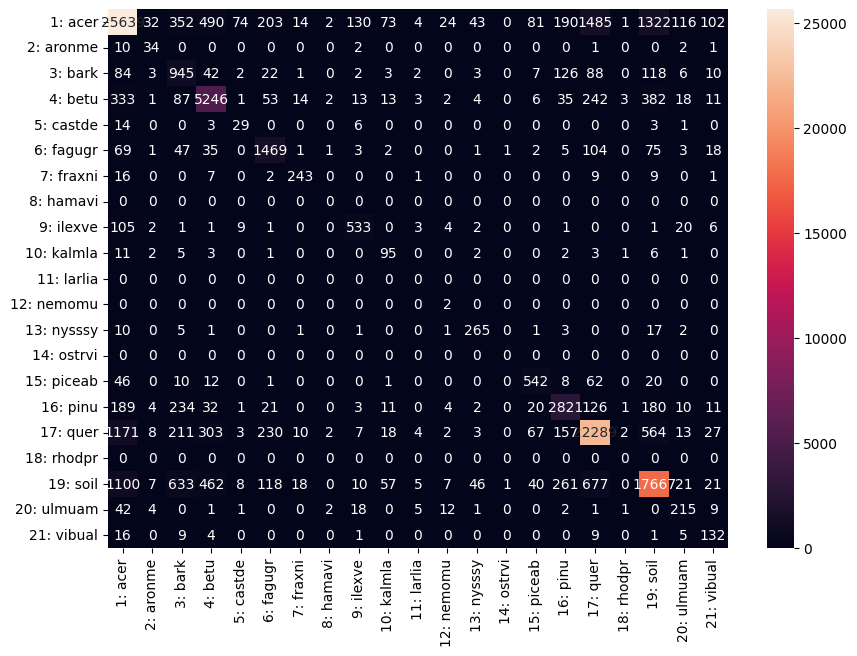

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
plt.figure(figsize = (10,7))
classes = ['1: acer', '2: aronme','3: bark', '4: betu', '5: castde', '6: fagugr',
           '7: fraxni','8: hamavi','9: ilexve',
           '10: kalmla', '11: larlia', '12: nemomu','13: nysssy',
           '14: ostrvi', '15: piceab','16: pinu',
           '17: quer', '18: rhodpr',  '19: soil','20: ulmuam','21: vibual'
          ]

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

<ipython-input-45-4d5787414292>:13: RuntimeWarning:

invalid value encountered in true_divide



{'rhodpr', 'ostrvi', 'larlia', 'hamavi'}


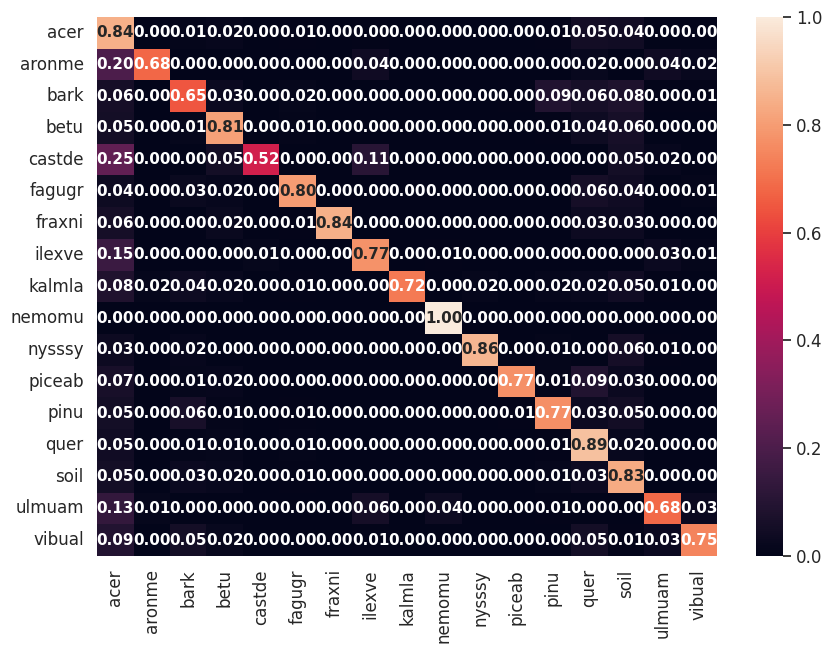

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
plt.figure(figsize = (10,7))
classes = ['acer', 'aronme','bark', 'betu', 'castde', 'fagugr',
           'fraxni','hamavi','ilexve',
           'kalmla', 'larlia', 'nemomu','nysssy',
           'ostrvi', 'piceab','pinu',
           'quer', 'rhodpr',  'soil','ulmuam','vibual'
          ]

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))
# Normalise
cmn = mat.astype('float') / mat.sum(axis=1)[:, np.newaxis]

df_cm = pd.DataFrame(cmn, index = classes, columns = classes)

# # Default drop rows that contains nan values
df2=df_cm.dropna()
#print(df2)

#print(df2.columns.tolist())
# Get the list of index names
index_names = df2.index.tolist()
# Get the list of column names
column_names = df2.columns.tolist()
# Find the set intersection of the two lists
# unique_names = set(index_names).intersection(column_names)
# # Print the unique names
# print(unique_names)
# find the set difference between the two lists
names_diff = set(column_names)-set(index_names)

# print the result
print(names_diff)
df2=df2.drop(columns=names_diff)

sns.set(font_scale=1.1)
#sns.heatmap(df2, annot=True, fmt='.2f')
sns.heatmap(df2, annot=True, annot_kws={"size":11, "weight": "bold"},fmt='.2f')

plt.show()